In [2]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [3]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.13.0.post200
1.9.1


In [4]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [5]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [6]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [7]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"best_ALL_1130_continue.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [8]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [9]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [ ]:
## GRN for the transition t0 to t1
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_current(x, pred_h, 0).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 1).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

In [11]:
# Save the array to disk
np.save('genesys_ctw_t0-t1.npy', ctw)

In [10]:
ctw = np.load('genesys_ctw_t0-t1.npy')

In [11]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [12]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [13]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [14]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [15]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: Name, dtype: int64

## Network analysis

In [16]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [17]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

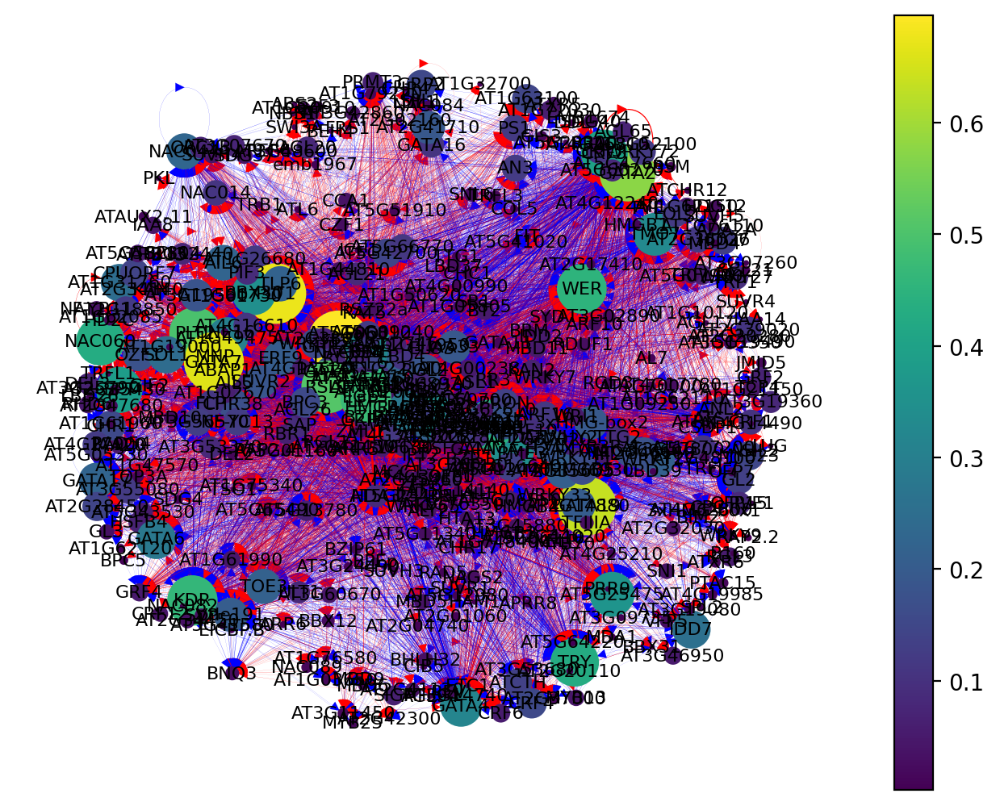

In [18]:
atri = network(0)

In [19]:
atri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
CRF2,0.972973,0.443694,0.529279,0.987778,0.001552,0.121887
HDA3,0.810811,0.085586,0.725225,0.987600,0.001709,0.116948
GATA2,1.157658,0.576577,0.581081,0.986390,0.001651,0.123640
NAC094,1.076577,0.693694,0.382883,0.972800,0.001532,0.118830
GATA4,0.752252,0.317568,0.434685,0.965210,0.001559,0.107537
...,...,...,...,...,...,...
TRFL3,0.049550,0.015766,0.033784,0.000000,0.000878,0.019458
TRP1,0.020270,0.002252,0.018018,0.000000,0.000704,0.008910
AT3G53680,0.038288,0.002252,0.036036,0.000000,0.000879,0.015820
AT5G58280,0.054054,0.047297,0.006757,0.000000,0.001022,0.018805


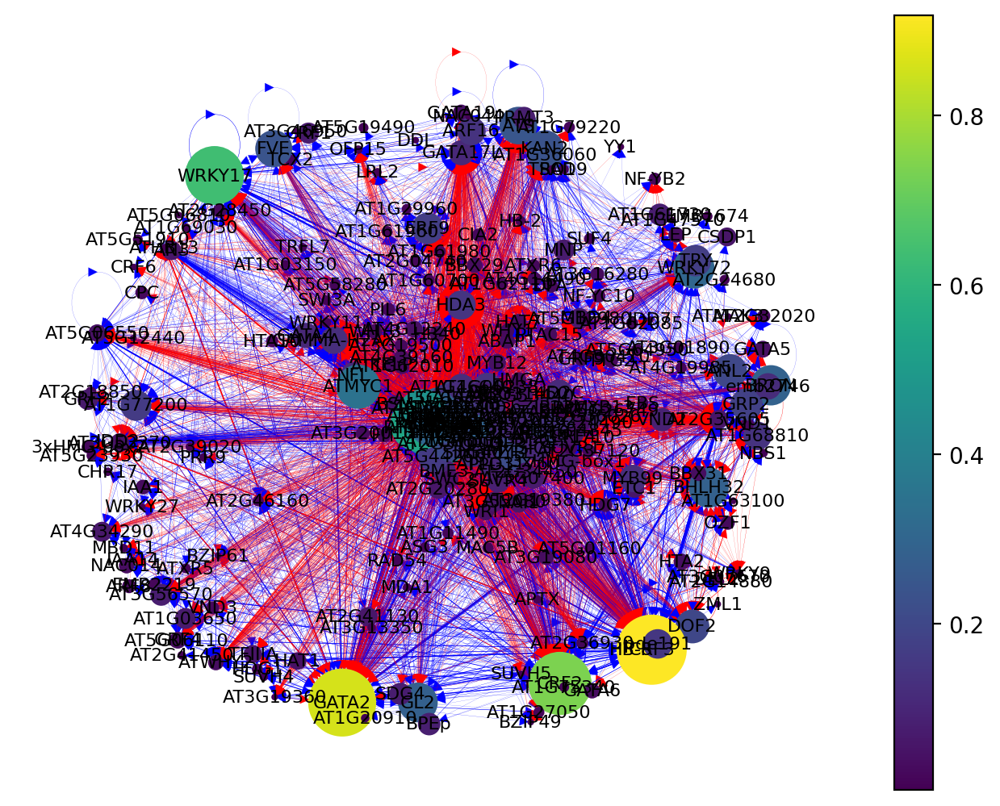

In [20]:
tri = network(1)

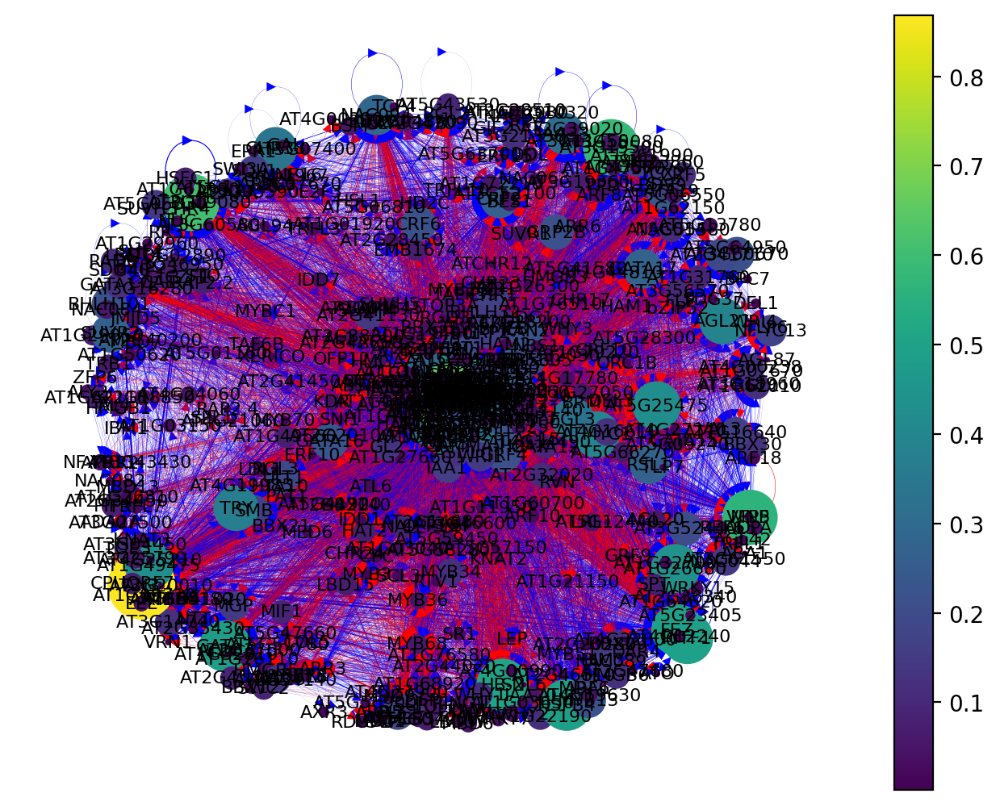

In [21]:
cor = network(2)

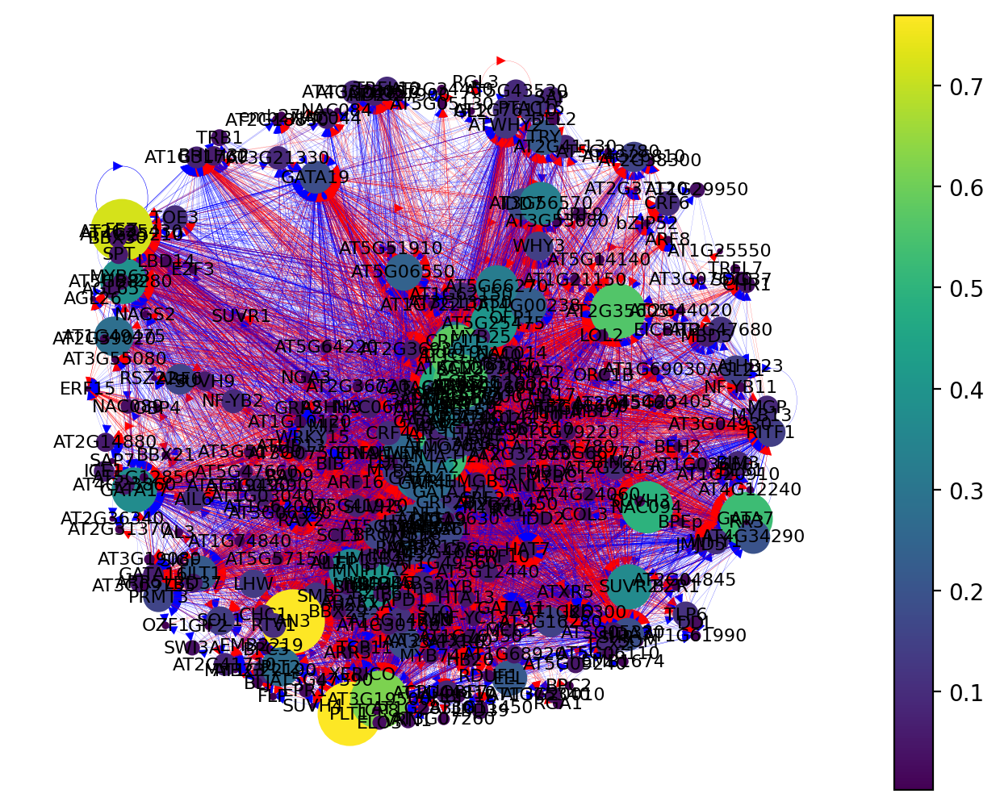

In [22]:
end = network(3)

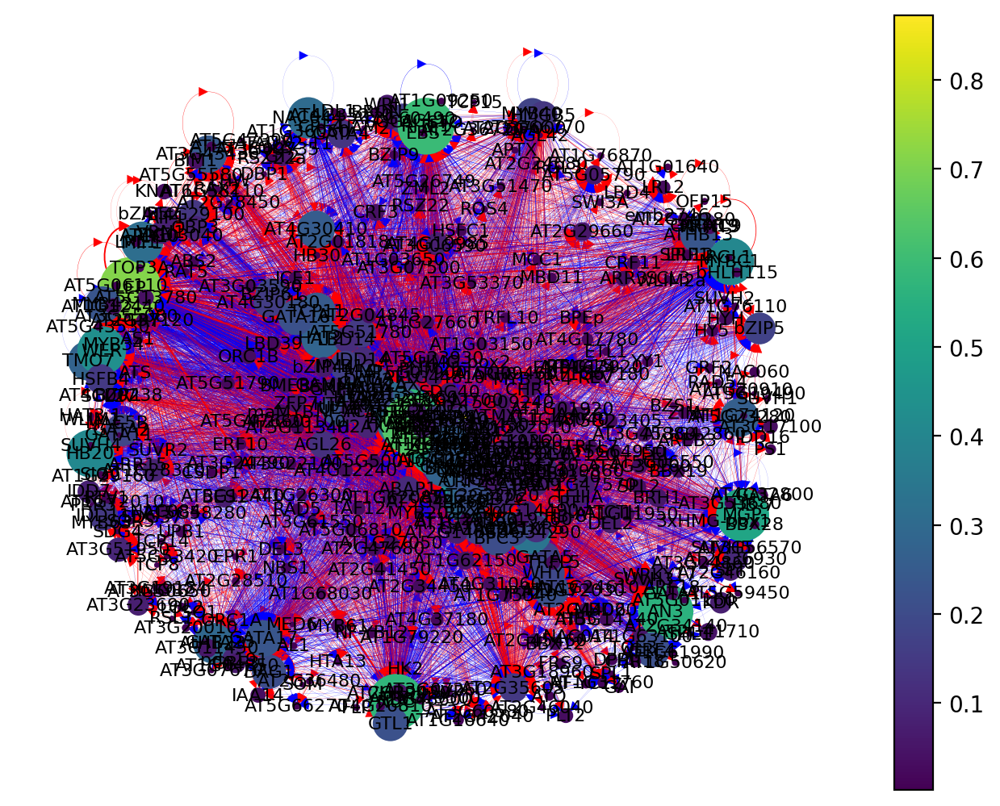

In [23]:
per = network(4)

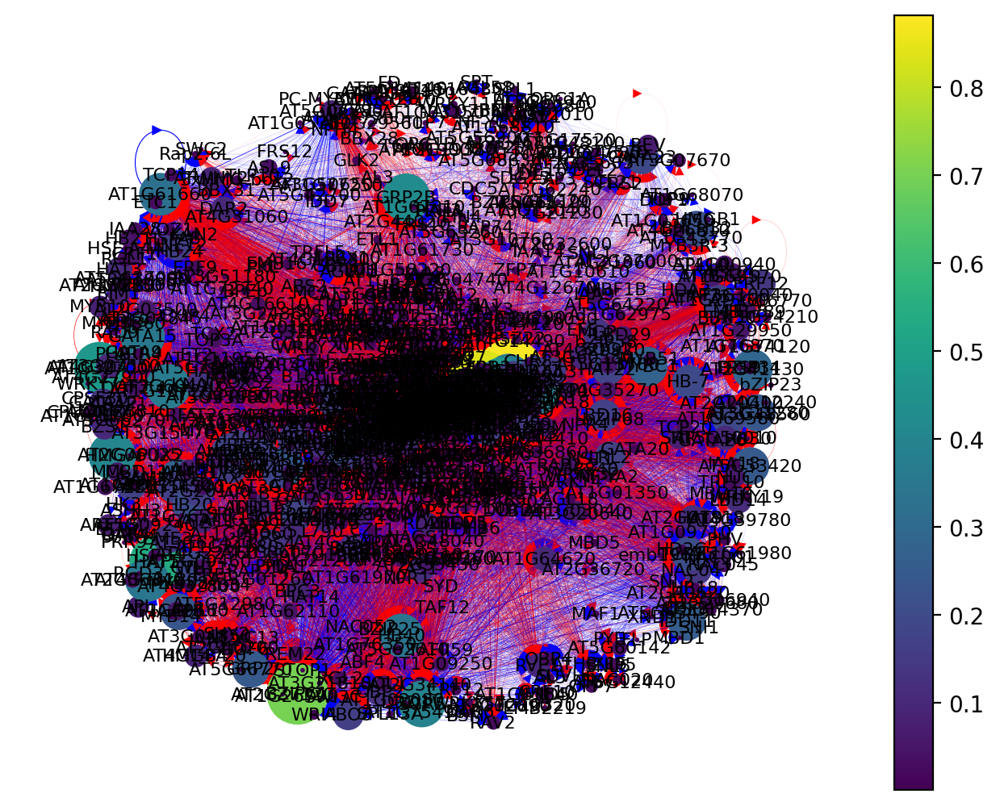

In [24]:
pro = network(5)

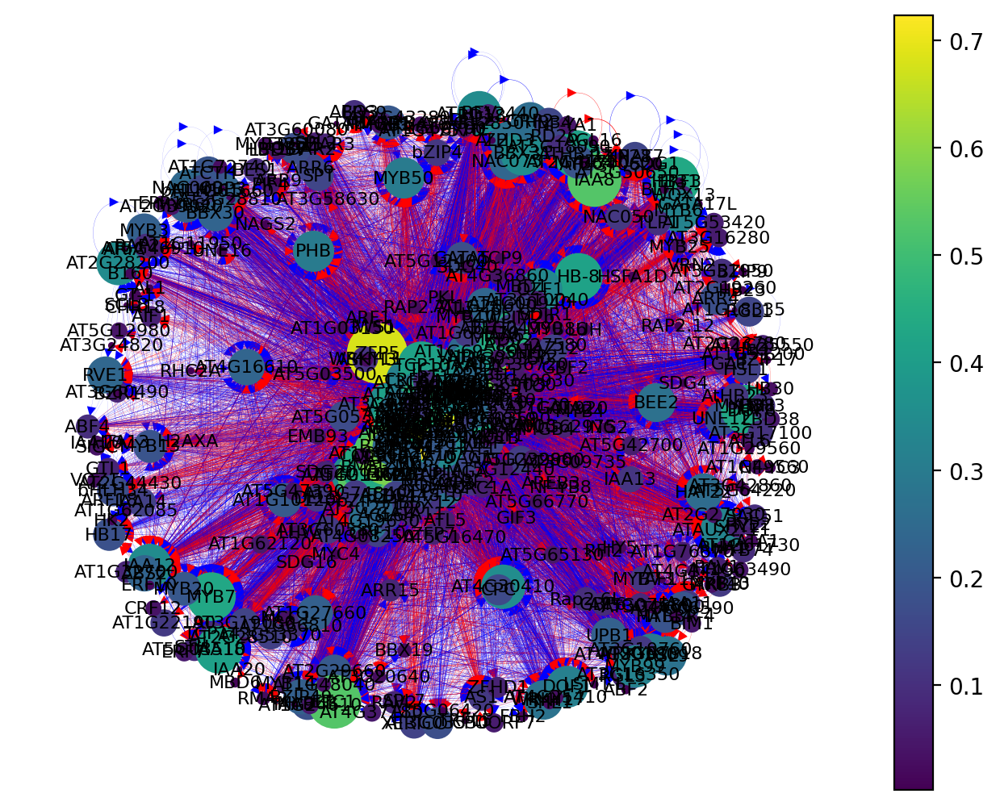

In [25]:
xyl = network(6)

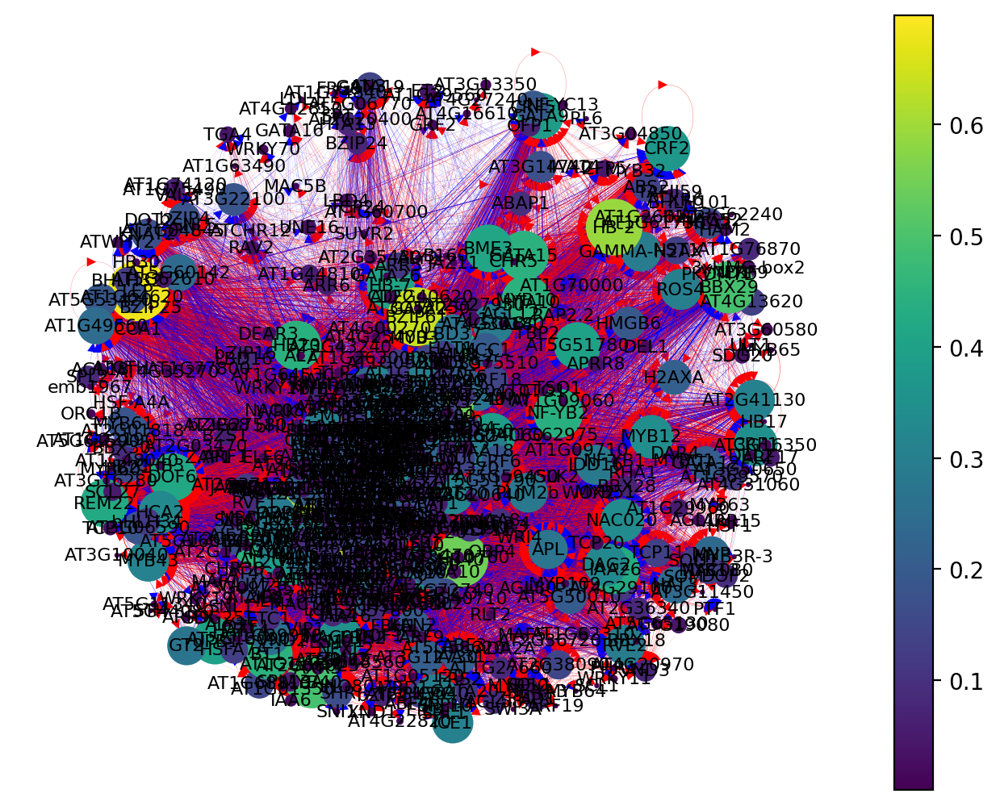

In [26]:
phl = network(7)

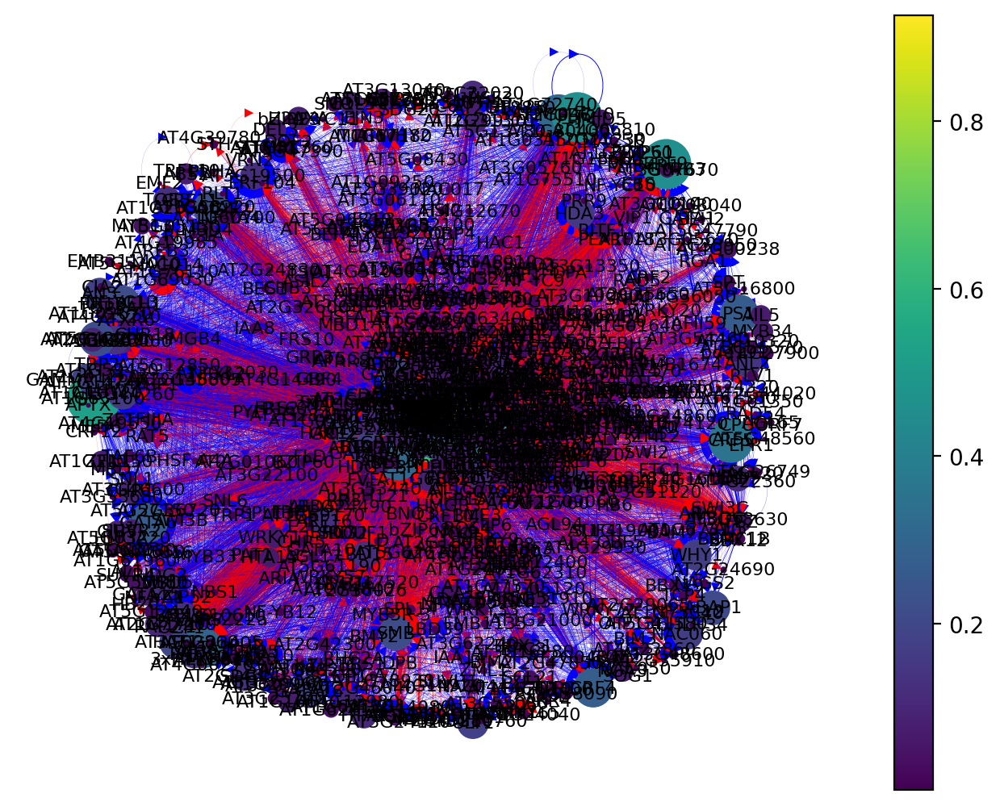

In [27]:
lrc = network(8)

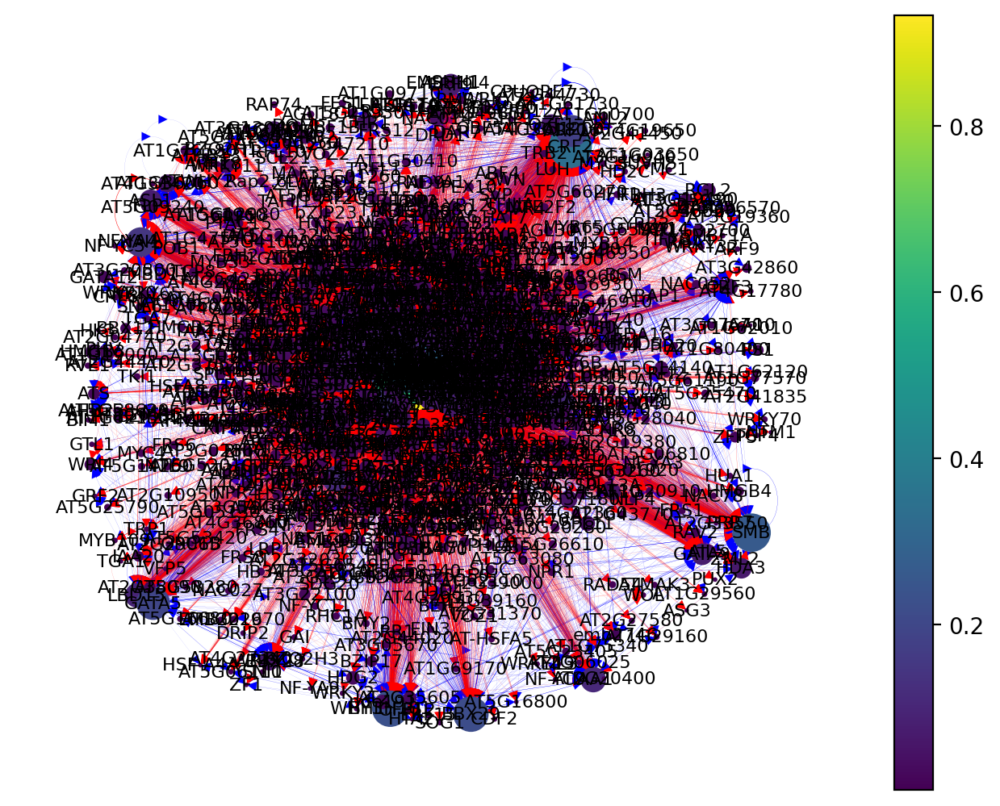

In [28]:
col = network(9)

In [29]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [30]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts(), columns=['tf_occurance'])
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [31]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
WRKY9,0.807150,0.048045,0.360050,0.015766,0.007782,0.010152,0.261261,0.085603,0.225888,9,10.821698
WRKY72,0.614285,0.160278,0.060996,0.119369,0.303502,0.005076,0.083333,0.108949,0.064721,9,10.520510


In [32]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
AT4G26810,0.702850,0.017783,0.045045,0.225681,0.304054,0.284047,6,7.579460
ORC1B,0.000031,0.000410,0.074324,0.151751,0.114865,0.163424,6,6.504805


In [33]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
LOL2,0.238357,0.121622,0.058559,3,3.418538
AT2G28450,0.118851,0.144144,0.150901,3,3.413896
IDD7,0.021257,0.256757,0.045045,3,3.323058
AT3G55080,0.020036,0.121622,0.060811,3,3.202469
AT1G27050,0.003050,0.090090,0.101351,3,3.194492
AT1G62150,0.000991,0.047297,0.087838,3,3.136127


In [34]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
RHD6,0.754727,0.214008,0.015564,3,3.984299
AT2G37120,0.556922,0.023346,0.147860,3,3.728128
GRF2,0.136354,0.066148,0.035019,3,3.237521
DEL3,0.103797,0.159533,0.147860,3,3.411190
AT4G39160,0.074538,0.035019,0.023346,3,3.132904
MBD6,0.022176,0.241245,0.089494,3,3.352915
AT1G11490,0.003040,0.015564,0.019455,3,3.038059
NF-YC10,0.002994,0.023346,0.015564,3,3.041905
AT5G13780,0.000410,0.233463,0.120623,3,3.354496
AT1G61990,0.000152,0.264591,0.073930,3,3.338673


In [35]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
AT1G69030,0.832179,0.021574,0.086294,3,3.940047
SDG4,0.437516,0.137056,0.032995,3,3.607566
AT2G32030,0.131091,0.019036,0.017766,3,3.167893
HDG1,0.014527,0.027919,0.021574,3,3.064019
AT1G50620,0.011931,0.110406,0.065990,3,3.188327
HMGB4,0.003946,0.030457,0.048223,3,3.082626
BIM3,0.002491,0.001269,0.022843,3,3.026603
AT5G66770,0.001242,0.007614,0.041878,3,3.050734
BEH1,0.000905,0.041878,0.003807,3,3.046590
MYB3R-4,0.000493,0.090102,0.062183,3,3.152778


In [36]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
AXR3,0.780327,0.155063,0.116034,3,4.051424
AT5G23405,0.625950,0.006329,0.011603,3,3.643882
NTT,0.385629,0.085443,0.154008,3,3.625081
HMGB3,0.153477,0.033755,0.021097,3,3.208329
NAC016,0.111774,0.037975,0.047468,3,3.197217
AT2G42660,0.090067,0.044304,0.021097,3,3.155468
RGL3,0.075948,0.358650,0.170886,3,3.605484
SUVH9,0.070555,0.029536,0.002110,3,3.102200
WRI4,0.067721,0.017932,0.028481,3,3.114135
STOP1,0.055243,0.015823,0.031646,3,3.102712


In [37]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
MYB36,0.989733,0.732886,0.043912,0.173789,0.411178,0.689459,6,9.040956
SCR,0.880072,0.301164,0.131737,0.227920,0.263473,0.433048,6,8.237414
MYB68,0.601681,0.180317,0.057884,0.153846,0.331337,0.527066,6,7.852131
JKD,0.749413,0.000049,0.031936,0.017094,0.357285,0.475783,6,7.631561
3xHMG-box1,0.060431,0.000016,0.375250,0.159544,0.127745,0.108262,6,6.831248


In [38]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
AT1G72210,0.304942,0.049900,0.221557,3,3.576399
HB4,0.234363,0.077844,0.043912,3,3.356120
AT5G05330,0.059206,0.141717,0.067864,3,3.268786
AGL65,0.001050,0.021956,0.035928,3,3.058934


In [39]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
RTV1,0.285535,0.102564,0.025641,3,3.413740
AT5G41920,0.182084,0.079772,0.051282,3,3.313138
LHW,0.017403,0.136752,0.019943,3,3.174098
ABAP1,0.011860,0.122507,0.019943,3,3.154310
AT3G19360,0.002841,0.065527,0.051282,3,3.119650
AT5G59450,0.001718,0.111111,0.094017,3,3.206846
RAT5,0.000155,0.116809,0.088319,3,3.205283
RVN,0.000114,0.054131,0.242165,3,3.296410


In [40]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G43430,0.947658,0.979319,0.521720,0.757036,0.243848,0.835280,0.348449,0.697674,0.241611,0.501168,0.460621,0.526578,12,19.060961
TCP11,0.935218,0.833272,0.153327,0.509865,0.246085,0.235981,0.341289,0.134551,0.308725,0.294393,0.264916,0.222591,12,16.480214
AT5G51780,0.748658,0.005252,0.354427,0.577717,0.154362,0.297897,0.501193,0.397010,0.183445,0.275701,0.250597,0.239203,12,15.985462
AT5G50010,0.002237,0.685507,0.180317,0.759385,0.022371,0.098131,0.632458,0.202658,0.145414,0.279206,0.403341,0.315615,12,15.726639
AT4G24060,0.040835,0.195324,0.547607,0.592512,0.194631,0.117991,0.486874,0.383721,0.107383,0.196262,0.455847,0.260797,12,15.579783
AT1G12440,0.891208,0.101644,0.415531,0.027446,0.040268,0.021028,0.062053,0.141196,0.060403,0.157710,0.064439,0.107973,12,14.090900
GTL1,0.009009,0.085349,0.001170,0.558344,0.217002,0.197430,0.076372,0.204319,0.098434,0.136682,0.062053,0.303987,12,13.950151
HAT3,0.000010,0.044692,0.749575,0.047034,0.100671,0.109813,0.181384,0.240864,0.035794,0.072430,0.219570,0.147841,12,13.949678
AT3G51950,0.534846,0.015400,0.000034,0.002103,0.096197,0.108645,0.102625,0.161130,0.091723,0.148364,0.033413,0.164452,12,13.458932


In [41]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT3G23690,0.685196,0.073826,0.055928,3,3.814950
GRF9,0.068679,0.277405,0.105145,3,3.451229
AT2G36340,0.047085,0.154362,0.064877,3,3.266325
VRN1,0.021569,0.082774,0.015660,3,3.120003
OFP1,0.005904,0.149888,0.073826,3,3.229617
AT4G19985,0.004620,0.078300,0.085011,3,3.167931
MYB25,0.002418,0.100671,0.076063,3,3.179151
SDG40,0.000020,0.058166,0.042506,3,3.100691


In [42]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
LBD16,0.772912,0.168224,0.429907,3,4.371043
HAT9,0.714341,0.080607,0.310748,3,4.105696
AT1G75490,0.466158,0.061916,0.114486,3,3.642560
AT4G20970,0.418462,0.108645,0.058411,3,3.585518
BZS1,0.416888,0.102804,0.117991,3,3.637682
AT2G20100,0.285058,0.157710,0.046729,3,3.489497
AT2G40200,0.272949,0.039720,0.148364,3,3.461033
AT1G03040,0.254993,0.064252,0.084112,3,3.403357
RAV2,0.202388,0.028037,0.154206,3,3.384631
MYBR1,0.199807,0.113318,0.094626,3,3.407751


In [43]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
VND7,0.988467,0.281623,0.608592,3,4.878681
VND1,0.986548,0.527446,0.715990,3,5.229985
LBD18,0.984835,0.066826,0.646778,3,4.698439
VND4,0.973753,0.176611,0.503580,3,4.653944
JLO,0.968471,0.031026,0.591885,3,4.591383
MYB46,0.964052,0.372315,0.572792,3,4.909159
XND1,0.955002,0.568019,0.677804,3,5.200826
VND5,0.944536,0.152745,0.491647,3,4.588928
IAA6,0.913739,0.451074,0.677804,3,5.042617
AT5G03510,0.878818,0.090692,0.482100,3,4.451611


In [44]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
APL,0.974834,0.272425,0.813953,3,5.061213
AT3G12730,0.964707,0.209302,0.644518,3,4.818528
AT2G03500,0.955810,0.280731,0.686047,3,4.922587
DOF6,0.949920,0.415282,0.622924,3,4.988126
AT5G41380,0.931761,0.194352,0.466777,3,4.592891
REM22,0.917618,0.421927,0.401993,3,4.741538
NAC020,0.909680,0.335548,0.498339,3,4.743567
NAC2,0.905457,0.192691,0.436877,3,4.535025
HCA2,0.902046,0.328904,0.509967,3,4.740916
NAC057,0.828547,0.333887,0.491694,3,4.654129


## Search for individual genes

In [45]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,...,xyl_in_centrality,xyl_betweenness_centrality,xyl_closeness_centrality,xyl_eigenvector_centrality,phl_degree_centrality,phl_out_centrality,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality
SHR,6.0,0.209581,0.169661,0.03992,0.737369,0.001846,0.047194,0.148148,0.116809,0.031339,...,0.221957,0.138545,0.001492,0.073361,0.280731,0.159468,0.121262,0.179678,0.001054,0.043674


In [46]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,0.279202,0.014245,0.264957,0.001093,0.06801


In [47]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_closeness_centrality,col_eigenvector_centrality
JKD,2.0,0.389222,0.031936,0.357285,0.749413,0.002287,0.073996,0.492877,0.017094,0.475783,0.000049,0.001144,0.090325,0.103376,0.037975,0.065401,0.000453,0.037795


In [48]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_closeness_centrality,col_eigenvector_centrality
RVN,1.0,0.151697,0.013972,0.137725,0.002143,0.039004,0.296296,0.054131,0.242165,0.000114,0.000935,0.068941,0.024262,0.016878,0.007384,0.000377,0.016152


In [49]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,0.219373,0.025641,0.193732,0.001052,0.055765


In [50]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [51]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [52]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,...,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
GL2,4.0,0.470721,0.132883,0.337838,0.884179,0.001421,0.088018,0.373541,0.280156,0.093385,...,0.129741,0.015968,0.006942,0.001566,0.037103,0.011396,0.005698,0.005698,0.00059,0.004701


In [53]:
tf_spec.to_csv('TF_GRN_centrality_t0-t1_zscore3.csv', index=True)